# Check equivital alignment at clapping music 
A notebook to evaluate device time offsets in equivital vest measurements during the Bodies in Concert recordings with the Stavangar orchestra. 

1. This notebook loads the fast accelerometer data from a set of concurrent ACC measurements, resamples and compares to a tapping cue template to offer an initial alignment.
2. Alignments are then checked and corrected with cross correlation information and saved
3. Alignment across concurrent recordings are ploted and assessed for quality and device reliability
4. TODO: Alignments are finally checked against other well timed moments in the concerts

Some of this notebook can be used to check the AX3 recordings and MS data when these are available.

In [1]:
import sys
import os
import time
import datetime as dt
import math
import numpy as np 
import scipy as sp
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import json 
from scipy.signal import butter, filtfilt, argrelextrema
from scipy import interpolate
from scipy.interpolate import interp1d

In [28]:
def eq_recordings(projectpath,projecttag,sep):
    file_locs = []
    for root, dirs, files in os.walk(projectpath):
        for file in files:
            if(file.endswith("EQDATA.csv")):
                if(file.lower().startswith(projecttag.lower())):
                    file_locs.append(os.path.join(root,file))
    if len(file_locs)>0:
        k=[]           
        for f in file_locs:
            File_dets=data_dets(f,sep)
            if File_dets:
                k.append(File_dets)
        df_datafiles=pd.DataFrame(data=k)#
        df_datafiles=df_datafiles.sort_values(by='RecStart').reset_index(drop=True)
        #df_datafiles.to_csv(projectpath + projecttag + '_Qiosk_recordings.csv')
        return df_datafiles
    else:
        print('Path is empty of DATA files.')
        return []
# fN ='_'.join([file_date,Concert,Piece,PartID,sigtype])+file_type
# /Users/finn/Desktop/Current_Projects/Stavanger/Data/Equivital/Reic/C2/2023-02-16_C1_REIC_VN205_EQDATA.csv
def data_dets(eq_file_loc,sep): #rec_start = V['DateTime'].iloc[0]
    if not sep:
        sep = '\\'
    # this file pulls recording details from the file name and from inside file to aggregate all metadata
    filings = eq_file_loc.split(sep)
    file_name = filings[-1]
    f = file_name.split('_')
    Signal = f[4][2:-4]
    DevName = f[3]#filings[-2]
    Concert = f[1]#filings[-2]
    Work = f[2]#filings[-2]
    fileDate = f[0] # interpret as datetime datatype?
    fileSize = os.path.getsize(eq_file_loc)
    
    V = pd.read_csv(eq_file_loc,skipinitialspace=True)
    
    V['DateTime'] = pd.to_datetime(V['DateTime'])
    rec_start = V['DateTime'].iloc[0]
    rec_end = V['DateTime'].iloc[-1]
    rec_dur=(rec_end-rec_start).total_seconds()
    Batt_start = V['BATTERY(mV)'].iloc[0]
    Batt_end = V['BATTERY(mV)'].iloc[-1]
    Batt_spend=(Batt_end-Batt_start)     

    a = V.loc[:,['SENSOR ID', 'SUBJECT ID', 'SUBJECT AGE', 'HR(BPM)',
       'HRC(%)', 'BELT OFF', 'LEAD OFF', 'MOTION', 'BODY POSITION']].mode().loc[0]

    File_dets={'Signal':Signal, #f[-2].split('_')[-1],
       'DevName':DevName,
       'ID':int(a['SENSOR ID']), 
       'Date':fileDate,
       'Session':Concert,
       'Interval':Work,
       'FileName':file_name,
       'FileType':'csv',
       'FileSize': fileSize,
       'RecStart':rec_start,
       'RecEnd':rec_end,
       'Duration':rec_dur,
       'BatteryStart':Batt_start,
       'BatteryEnd':Batt_end,
       'BatteryChange(mV)':Batt_spend,
       'FullLoc':eq_file_loc,}
    File_dets.update(a) # dic0.update(dic1)
    return File_dets

def matched_files(eq_file_loc,data_path,sep):
    if not sep:
        sep = '\\'
    # from the location of a good file and the location of other files, retrieve the location of all matching files
    dfile = min_dets(eq_file_loc,sep)
        # 15_RE_REIC_WW505_EQDATA.csv
    
    # retrieve the files in that path that match 
    file_locs = []
    for root, dirs, files in os.walk(data_path):
        for file in files:
            if(file.lower().endswith(".csv")):
                file_locs.append(os.path.join(root,file))
    k=[]
    for file in file_locs:
        if not file.lower().endswith('recordings.csv'):
#             print(file)
            File_dets=min_dets(file,sep)
            k.append(File_dets)
    df_files=pd.DataFrame(data=k)
#     print(df_files)
    df_files.columns
    match_fields = ['ID','Date','Session','Piece','Recording']

    matched_files = df_files.loc[df_files['Recording'] == dfile['Recording']]
    for mf in match_fields[1:]:
        matched_files = matched_files.loc[matched_files[mf] == dfile[mf]]

    return list(matched_files['FullLoc'])
    
def min_dets(eq_file_loc,sep): # for csv files output by the qiosk app
    if not sep:
        sep = '\\'
    filings = eq_file_loc.split(sep)
    file_name = filings[-1]
    fileSize = os.path.getsize(eq_file_loc)
    f = file_name.split('_')
    if len(f)== 5:
        #fn_new ='_'.join([file_date,Concert,Piece,PartID,sigtype])+file_type
        # 2023-02-15_RE_REIC_WW505_EQDATA.csv
        fileDate = pd.to_datetime(f[0],format = '%Y-%m-%d')
        Session = f[1]
        Piece = f[2]
        ID = f[3]
        Signal = f[4][:-4]
        rec_name = '_'.join(f[:4])
        File_dets={'Signal':Signal, #f[-2].split('_')[-1],
           'ID':ID, 
           'Date':fileDate,
           'Session':Session,
           'Piece': Piece,
           'FileName':file_name,
           'FileSize': fileSize,
           'Recording':rec_name,
           'FullLoc':eq_file_loc}
    else:
        Signal = f[0]
        ID = f[1]#filings[-2]
        DevID = int(f[2])
        fileDate = pd.to_datetime(f[3][:6],format = '%y%m%d')
        rec_name = '_'.join(f[:4])
        # sometimes the session numbering fails and we get files with the same session number but an additiona _0 or _1
        # how to number this? What errors are producing these session numbers?
        if len(f[3].split('_'))==2: # we have an additional numbering to work into the sessions. :[
            Sessn1 = int(f[3].split('_')[0][6:8])
            Sessn2 = int(f[3].split('_')[1].split('.')[0])
            Session = (Sessn1+1)*100 + Sessn2+1 # yes this makes the session numbers huge out of nowhere, but it won't overlap with QIOSKs proper numbering that goes up to 99
        else:
            Session = int(f[3][6:8])
        File_dets={'Signal':Signal, #f[-2].split('_')[-1],
           'ID':ID, 
           'Date':fileDate,
           'Session':Session,
           'FileName':file_name,
           'FileSize': fileSize, 
           'Recording':rec_name,
           'FullLoc':eq_file_loc}
    return File_dets
    

In [3]:
%load_ext autoreload
%autoreload 1
%aimport qex

In [4]:
%reload_ext autoreload

In [5]:
def tap_cue_align(cue,sig_ex,sig_ID):
    # a function to take a segment of signal and the tapping cue to determing
    # the best shift value would allow alignment of signal to cue
    signal = sig_ex.copy()
        # make the signal excerpt corr compatible. Inclusing cutting the extreme peaks
    signal[signal.isna()] = 0
    M = signal.quantile(0.998)
    signal = signal/M
    signal[signal>1] = 1
    
    # cue must be sampled at the same steady rate as the signal exerpt
    sampleshift_s = cue.index.to_series().diff().median()
    length = np.min([len(signal),len(cue)])
    
    if signal.diff().abs().sum()<0.1: # signal is flat
        shifts.append(np.nan)
        print('sig_ex is too flat.')
        return
    else:
        fig = plt.figure(figsize=(15,6))
        ax1 = plt.subplot(311)
        signal.plot(label=sig_ID,ax=ax1,)
        cue.plot.line(y='cue',ax=ax1)
        ax1.set_title(sig_ID + ' synch alignment')
        ax1.legend()
        #plt.xlim(cue_range)
        
        ax2 = plt.subplot(312)
        CCC = ax2.xcorr(cue['cue'].iloc[:length], signal.iloc[:length], usevlines=True, maxlags=length-1, normed=True, lw=3)
        ax2.grid(True)
        ax2.set_xticklabels('')
        signal.index = signal.index + sampleshift_s*CCC[0][np.argmax(CCC[1])]
        
        ax1 = plt.subplot(313)
        signal.plot(label=sig_ID,ax=ax1,)
        cue.plot.line(y='cue',ax=ax1)
#         plt.xlim(cue_range)
        ax1.grid(True)
        ax1.set_title('shift '+ str(sampleshift_s*CCC[0][np.argmax(CCC[1])])+ ' s')
        #plt.saveas('')
        plt.show()

    shift_stats = {"s_corr0": CCC[1][CCC[0]==0][0], # alignment quality without adjustment,
                   "s_corr_offset": np.amax(CCC[1]),
                   "s_offset_samples": CCC[0][np.argmax(CCC[1])], # shifts
                   "s_offset_time": sampleshift_s*CCC[0][np.argmax(CCC[1])],
                   "Length_xcorr_samples": len(CCC[0]),
                   "Length_xcorr_time": len(CCC[0])*sampleshift_s,
                   "devID": sig_ID,
                   "auto_offset_time":sampleshift_s*CCC[0][np.argmax(CCC[1])],
                   "Full_CCC": CCC

    }
    return shift_stats

# Define tapping cue template
Devices start at different time, record timestamps using their own clocks, and at their own sample rates. All device recordings should feature acceleration (and other signal) bumps at the time of the tapping synch cue. A tapping template is constructed and resampled to fit each signal to determine the timing of concert time zero across devices. 

The tapping cue template is constructed from the timing of beeps and taps according to an audio recording of the experiment. The cue is shaped from beep onset timings and smoothing to correlate reliably with absolute jerk of taps (norm of first order difference on 3D acc signals).

In [186]:
#For Dress rehearsal taps and any others on Wed. 15th, use synch_cues.csv
#For all concerts synch taps from Thr 16th, use short_synch_cue.csv

#concert_times = pd.read_csv('./Timing/synch_cue.csv',",",header=None) #SV alignment for beeps
claps_times = pd.read_csv('./Timing/C2_reic_claps.csv',",") #SV alignment for beeps
claps_times['PTime'] = claps_times['TIME']-claps_times.loc[0,'TIME']
# clap_times['S_AudioTime'] = np.round(concert_times[0],3) # reset to 50 hz
# clap_times['event'] = concert_times[1]
# clap_times['CTime'] = concert_times['S_AudioTime']-concert_times.loc[3,'S_AudioTime'] # zero on onset of first synch cue
claps_times

,TIME,LABEL,PTime
0,1069.628,New Point,0.000
1,1069.860,New Point,0.232
2,1070.020,New Point,0.392
3,1070.352,New Point,0.724
4,1070.528,New Point,0.900
5,1070.832,New Point,1.204
6,1071.200,New Point,1.572
7,1071.388,New Point,1.760
8,1071.708,New Point,2.080
9,1071.884,New Point,2.256


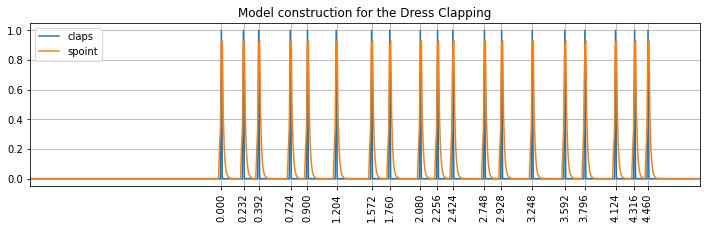

In [187]:
t_range = [-15, 25]
# cues for synchronisation taps
cues = pd.DataFrame(index = np.round(np.arange(0,t_range[1]-t_range[0],0.01)+t_range[0],2))
sampleshift = 1.0/256 # seconds 


cues['claps'] = 0
for t in claps_times['PTime']:
    cues.loc[np.round(t,2),'claps'] = 1

cues['spoint'] = 0.5*cues['claps'].rolling(2, win_type='gaussian', center=True).sum(std=2) + 0.5*cues['claps'].rolling(5, win_type='gaussian', center=True).sum(std=3).ewm(span = 3).mean()
cues[cues.isna()] = 0
# triang(M, sym=True)
Cue_template = cues.copy()
Cue_template.plot(figsize = [12,3]) 
plt.xticks(claps_times.PTime,rotation='vertical')
plt.grid()
plt.xlim([-2,5])
plt.title('Model construction for the Dress Clapping')
#plt.savefig('./Timing/synch1_cues.png')
plt.show()

#Cue_template.to_csv('./Timing/Synch_Cue_template_100Hz.csv')

In [8]:
player_order = ['VN102','VN107','VN106','VN108','VN101','VN105','VN103','VN104','VN205','VN203','VN202','VN206','VN209','VN210','VN207','VN208','VN201','VN204','VA305','VA307','VA308','VA301','VA306','VA302','VA303','VA304','LS406','LS407','LS408','LS405','LS401','LS403','LS402','LS410','LS404','WW505','WW502','WW503','WW506','WW501','WW504','WW507','BR604','BR603','BR602','BR606','BR607','BR605','BR601','PC704','PC705','PC703','PC701','PC702','PC707']

## Find data from Equivital

# Identify synch timing across devices
Need to evaluate times in 

- Equivitals
- Movesense
- AX3

This information can be matched to timing in:
- Pupillabs
- Nanesense
- AV

Equivital synchronisation cues fell in these intervals of time by their own device close.
AX3 may be similar. 
Times in UTC

In [9]:
synch_times = {'RD':pd.to_datetime('2023-02-15 12:05:36.897+0100'), # 97.0 
                 'C1':pd.to_datetime('2023-02-16 9:33:18.324+0100'),
                 'C2':pd.to_datetime('2023-02-16 11:16:22.697+0100'),
                 'C3':pd.to_datetime('2023-02-17 9:30:51.841+0100'),
                 'C4':pd.to_datetime('2023-02-17 11:16:29.298+0100'),
                 'C5':pd.to_datetime('2023-02-18 16:10:29.583+0100')}

In [10]:
Piece_timings = pd.read_csv('./Timing/ctimes.csv',index_col = 'Event')
Piece_timings 

,RD,C1,C2,C3,C4,C5
Event,,,,,,
Pre-Audio,NaN,NaN,-421.378,NaN,NaN,-981.902
Warmup,-300.000,-348.482,-361.303,-52.946,-344.999,-386.462
Tuning,-58.745,-61.511,-49.122,-48.773,-48.983,-225.636
Synch Taps,0.000,0.000,0.000,0.000,0.000,0.000
Applause for Conductor,19.294,28.292,122.014,76.074,21.929,-30.137
Saevarud,43.907,44.900,3279.222,3288.046,30.147,15.336
Applause for Saevarud,280.462,279.156,3511.465,3518.249,265.054,246.166
MC pre Reich,285.523,294.284,268.682,218.914,274.913,257.826
Reich,673.822,723.922,648.230,579.166,653.881,694.972


In [11]:
clap_times = {}
for c in synch_times.keys():
    clap_times[c] = (synch_times[c] + pd.to_timedelta(Piece_timings.loc['Reich',c],unit='s')).tz_convert(None)
    
clap_times  

{'RD': Timestamp('2023-02-15 11:16:50.719000'),
 'C1': Timestamp('2023-02-16 08:45:22.246000'),
 'C2': Timestamp('2023-02-16 10:27:10.927000'),
 'C3': Timestamp('2023-02-17 08:40:31.007000'),
 'C4': Timestamp('2023-02-17 10:27:23.179000'),
 'C5': Timestamp('2023-02-18 15:22:04.555000')}

In [13]:
Piece_timings = pd.read_csv('/Users/finn/Desktop/Current_Projects/Stavanger/Analysis/Timing/ctimes.csv',index_col = 'Event')
# translate Piece_timings to Piece_dt
Piece_dt = pd.DataFrame(index = Piece_timings.index, columns = Piece_timings.columns)
for col in Piece_timings.columns:
    Piece_dt[col] = pd.to_timedelta(Piece_timings[col],unit='s')+synch_times[col]
Piece_dt.loc[['Reich','Applause for Reich'],:]
synch_intervals=pd.DataFrame(index = Piece_timings.columns)
synch_intervals['Start'] = Piece_dt.loc['Reich',:]-pd.to_timedelta(15,unit='s')
synch_intervals['End'] = Piece_dt.loc['Reich',:]+pd.to_timedelta(30,unit='s')#Piece_dt.loc['Applause for Reich',:]
synch_intervals

,Start,End
RD,2023-02-15 12:16:35.719000+01:00,2023-02-15 12:17:20.719000+01:00
C1,2023-02-16 09:45:07.246000+01:00,2023-02-16 09:45:52.246000+01:00
C2,2023-02-16 11:26:55.927000+01:00,2023-02-16 11:27:40.927000+01:00
C3,2023-02-17 09:40:16.007000+01:00,2023-02-17 09:41:01.007000+01:00
C4,2023-02-17 11:27:08.179000+01:00,2023-02-17 11:27:53.179000+01:00
C5,2023-02-18 16:21:49.555000+01:00,2023-02-18 16:22:34.555000+01:00


# Concert aligned

In [176]:
projectName = 'C2'
sep = '/'
path = '../Data/Equivital/Reic/' + projectName + sep


# signal File type and column name (multi sample)
signal_file_type = 'EQACC'
sample_period = 1.0/256 # seconds 
interval_name = 'C2_Reic'
sigName = 'ACC'

synch_t = pd.to_datetime('2023-02-16 10:27:10.927+0000') 
s_time = pd.to_datetime('2023-02-16 10:26:55.927+0000')
e_time = pd.to_datetime('2023-02-16 10:27:40.927+0000')
dur = (e_time - s_time).total_seconds()
time_s =  np.round(np.arange(0,dur,sample_period),3)

time_dt = s_time + pd.to_timedelta(time_s,unit='s')
df_sig = pd.DataFrame(index = time_dt)

In [178]:
projTag = '2023-02-16_C1_REIC' # 2023-02-15_RE_DREI_VN210_EQIBI.csv 2023-02-16_C1_REIC_WW505_EQACC
path = '../Data/Equivital/Reic/' + projectName + sep
sep = '/'
df_datafiles = eq_recordings(path,projTag,sep)
df_datafiles.set_index('DevName',inplace=True)
df_datafiles

,Signal,ID,Date,Session,Interval,FileName,FileType,FileSize,RecStart,RecEnd,...,FullLoc,SENSOR ID,SUBJECT ID,SUBJECT AGE,HR(BPM),HRC(%),BELT OFF,LEAD OFF,MOTION,BODY POSITION
DevName,,,,,,,,,,,,,,,,,,,,,
BR603,DATA,5022193,2023-02-16,C1,REIC,2023-02-16_C1_REIC_BR603_EQDATA.csv,csv,957,2023-02-16 10:26:56+00:00,2023-02-16 10:29:11+00:00,...,../Data/Equivital/Reic/C2/2023-02-16_C1_REIC_B...,5022193.0,BR603,NaN,87.0,99.0,0.0,0.0,MovingSlowly,Upright
VN101,DATA,3420415,2023-02-16,C1,REIC,2023-02-16_C1_REIC_VN101_EQDATA.csv,csv,963,2023-02-16 10:26:56+00:00,2023-02-16 10:29:11+00:00,...,../Data/Equivital/Reic/C2/2023-02-16_C1_REIC_V...,3420415.0,VN101,NaN,78.0,98.0,0.0,0.0,MovingSlowly,Upright
VA308,DATA,5022131,2023-02-16,C1,REIC,2023-02-16_C1_REIC_VA308_EQDATA.csv,csv,961,2023-02-16 10:26:56+00:00,2023-02-16 10:29:11+00:00,...,../Data/Equivital/Reic/C2/2023-02-16_C1_REIC_V...,5022131.0,VA308,NaN,78.0,100.0,0.0,0.0,MovingSlowly,Upright
PC702,DATA,5022240,2023-02-16,C1,REIC,2023-02-16_C1_REIC_PC702_EQDATA.csv,csv,957,2023-02-16 10:26:56+00:00,2023-02-16 10:29:11+00:00,...,../Data/Equivital/Reic/C2/2023-02-16_C1_REIC_P...,5022240.0,PC702,NaN,81.0,98.0,0.0,0.0,MovingSlowly,Upright
BR602,DATA,5022184,2023-02-16,C1,REIC,2023-02-16_C1_REIC_BR602_EQDATA.csv,csv,951,2023-02-16 10:26:56+00:00,2023-02-16 10:29:11+00:00,...,../Data/Equivital/Reic/C2/2023-02-16_C1_REIC_B...,5022184.0,BR602,NaN,74.0,99.0,0.0,0.0,Stationary,Upright
LS405,DATA,5022143,2023-02-16,C1,REIC,2023-02-16_C1_REIC_LS405_EQDATA.csv,csv,961,2023-02-16 10:26:57+00:00,2023-02-16 10:29:12+00:00,...,../Data/Equivital/Reic/C2/2023-02-16_C1_REIC_L...,5022143.0,LS405,NaN,94.0,98.0,0.0,0.0,MovingSlowly,Upright
VN108,DATA,5022009,2023-02-16,C1,REIC,2023-02-16_C1_REIC_VN108_EQDATA.csv,csv,945,2023-02-16 10:26:57+00:00,2023-02-16 10:29:12+00:00,...,../Data/Equivital/Reic/C2/2023-02-16_C1_REIC_V...,5022009.0,VN108,NaN,94.0,98.0,0.0,0.0,Stationary,Upright
VN104,DATA,3420456,2023-02-16,C1,REIC,2023-02-16_C1_REIC_VN104_EQDATA.csv,csv,967,2023-02-16 10:26:57+00:00,2023-02-16 10:29:12+00:00,...,../Data/Equivital/Reic/C2/2023-02-16_C1_REIC_V...,3420456.0,VN104,NaN,102.0,98.0,0.0,0.0,MovingSlowly,Upright
VN206,DATA,5022062,2023-02-16,C1,REIC,2023-02-16_C1_REIC_VN206_EQDATA.csv,csv,952,2023-02-16 10:26:57+00:00,2023-02-16 10:29:12+00:00,...,../Data/Equivital/Reic/C2/2023-02-16_C1_REIC_V...,5022062.0,VN206,NaN,70.0,100.0,0.0,0.0,Stationary,Upright


In [179]:
s_files = df_datafiles
path

'../Data/Equivital/Reic/C2/'

In [180]:
# for acceleration
signal_file_type = 'EQACC'
for i,row in s_files.iterrows():
    dataFile = row['FullLoc']
    PartName = i

    sigFileLoc = []
    matched = matched_files(dataFile,path,sep)
    for f in matched:
        if signal_file_type in f:
            sigFileLoc = f

    if sigFileLoc:
        V = pd.read_csv(sigFileLoc,skipinitialspace=True)
        V['DateTime'] = pd.to_datetime(V['DateTime']) 
        sig_t = (V['DateTime'].dt.tz_localize(None) - s_time.tz_localize(None)).dt.total_seconds()
        cols = V.columns
        df = V.loc[:,[ 'Vert Accelerometer','Lat Accelerometer','Long Accelerometer']]
        sig_v = np.sqrt(np.square(df.diff()).sum(axis=1))
        f = interpolate.interp1d(sig_t,sig_v,fill_value='extrapolate')
        new_sig = f(time_s)
        if pd.Series(new_sig).diff().abs().sum()/len(new_sig)>1: # since th
            df_sig.loc[:,PartName] = new_sig

In [181]:
data = df_sig.loc[:,player_order].copy()
data.iloc[:5,:]

,VN102,VN107,VN106,VN108,VN101,VN105,VN103,VN104,VN205,VN203,...,BR606,BR607,BR605,BR601,PC704,PC705,PC703,PC701,PC702,PC707
2023-02-16 10:26:55.927000+00:00,-4.898979,-7.483315,-6.000000,-13.294736,-2.828427,-2.000000,-8.139410,-6.000000,-9.380832,-5.338539,...,0.000000,-4.949747,-5.315073,-2.828427,-1.500000,-6.500000,-4.472136,-4.716991,-5.678908,-7.211103
2023-02-16 10:26:55.931000+00:00,4.898979,7.483315,6.000000,13.294736,2.828427,2.000000,8.139410,6.000000,9.380832,5.338539,...,0.000000,4.949747,5.315073,2.828427,1.500000,6.500000,4.472136,4.716991,5.678908,7.211103
2023-02-16 10:26:55.935000+00:00,15.097019,11.955451,14.246211,15.294736,7.100429,8.000000,15.622725,12.633250,16.014081,15.046783,...,2.828427,10.606602,8.779175,6.029989,4.701562,18.426860,12.611546,7.545418,15.678908,10.039530
2023-02-16 10:26:55.939000+00:00,21.152490,15.426587,15.174414,6.500000,8.744138,10.272002,12.382294,11.532229,9.461677,15.708244,...,6.828427,13.546721,7.495230,18.441313,10.701562,23.339573,12.170539,9.013086,13.201562,4.828427
2023-02-16 10:26:55.943000+00:00,18.165554,24.220950,15.413485,10.352350,6.972136,12.653529,6.898979,14.898979,11.546225,8.828427,...,6.828427,14.523116,6.859556,23.485962,10.701562,20.130510,12.277340,9.013086,9.701562,6.898979


In [182]:
s_time = data.index[0]
e_time = data.index[-1] 
sig_t = np.round(pd.Series(data.index - s_time).dt.total_seconds(),3)
df_sig = pd.DataFrame(index = sig_t, columns = data.columns,data = data.values)

t1 = 10
t2 = 20

interval_name = 'Synch'
sub_sig = df_sig.loc[t1:t2,:].copy()

dev_int_s_time = s_time + pd.to_timedelta(t1,unit='s')
dev_int_s_time

Timestamp('2023-02-16 10:27:05.927000+0000', tz='UTC')

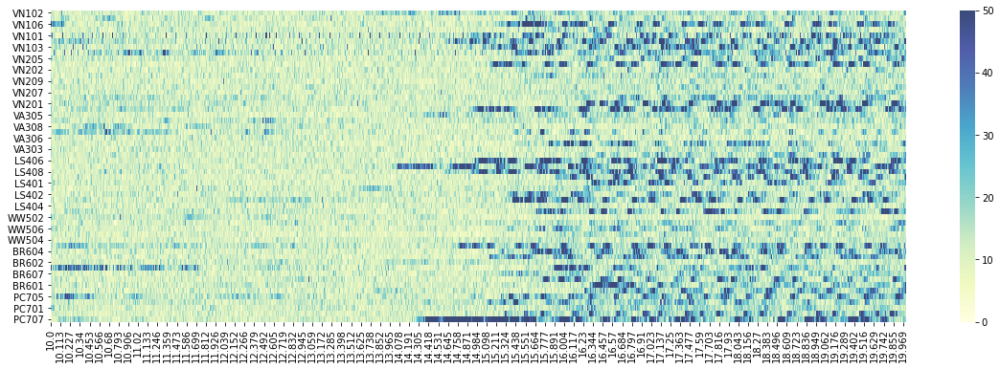

In [183]:
fig, (ax1) = plt.subplots(1, 1,figsize = [20,6])
chart = sns.heatmap(data=sub_sig.transpose(), ax=ax1,vmin=0, vmax=50, cbar=True,cmap="YlGnBu",alpha=0.8)
#plt.title(projectName + ' ' + sigName + ' for interval ' + interval_name)
plt.savefig('./plots/'+projectName+'_'+ interval_name+ '_set_'+sigName+'.png',dpi = 300)
plt.show()

In [184]:
initial_offset = 15

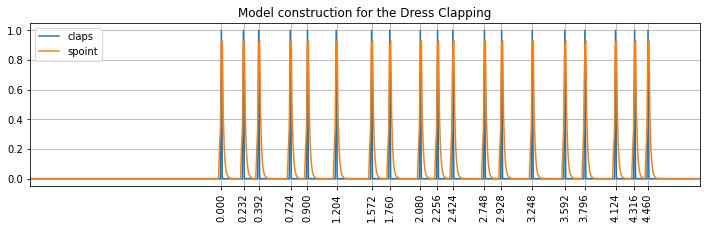

In [188]:
t_range = [-15, 25]
# cues for synchronisation taps
cues = pd.DataFrame(index = np.round(np.arange(0,t_range[1]-t_range[0],0.01)+t_range[0],2))
sampleshift = 1.0/256 # seconds 


cues['claps'] = 0
for t in claps_times['PTime']:
    cues.loc[np.round(t,2),'claps'] = 1

cues['spoint'] = 0.5*cues['claps'].rolling(2, win_type='gaussian', center=True).sum(std=2) + 0.5*cues['claps'].rolling(5, win_type='gaussian', center=True).sum(std=3).ewm(span = 3).mean()
cues[cues.isna()] = 0
# triang(M, sym=True)
Cue_template = cues.copy()
Cue_template.plot(figsize = [12,3]) 
plt.xticks(claps_times.PTime,rotation='vertical')
plt.grid()
plt.xlim([-2,5])
plt.title('Model construction for the Dress Clapping')
#plt.savefig('./Timing/synch1_cues.png')
plt.show()

#Cue_template.to_csv('./Timing/Synch_Cue_template_100Hz.csv')

2561
2561


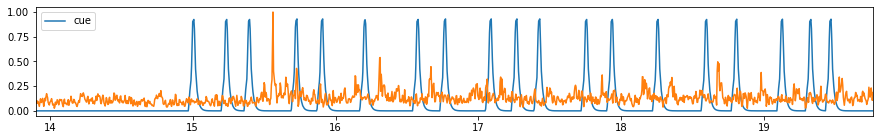

In [189]:
sensorID = 'VN107'
cues = Cue_template.copy()
cues['time_concert'] = cues.index
cues['DeviceTime'] = cues.index + initial_offset
cues.set_index('DeviceTime',inplace=True)

sig_ex = sub_sig[sensorID]/sub_sig[sensorID].max()
print(len(sig_ex))
sig_ID = sensorID
cuetype = 'spoint'

f = interpolate.interp1d(cues.index, cues[cuetype],fill_value='extrapolate')
cued = pd.DataFrame(index = sig_ex.index,data = f(np.array(sig_ex.index)),columns = ['cue'])
f = interpolate.interp1d(cues.index, cues['time_concert'],fill_value='extrapolate')
cued['time_concert'] = f(np.array(sig_ex.index))
print(len(cued))

cued.plot.line(y = 'cue')
sig_ex.plot(figsize=[15,2])
plt.xlim([cued.index[1000],cued.index[2500]])

plt.show()

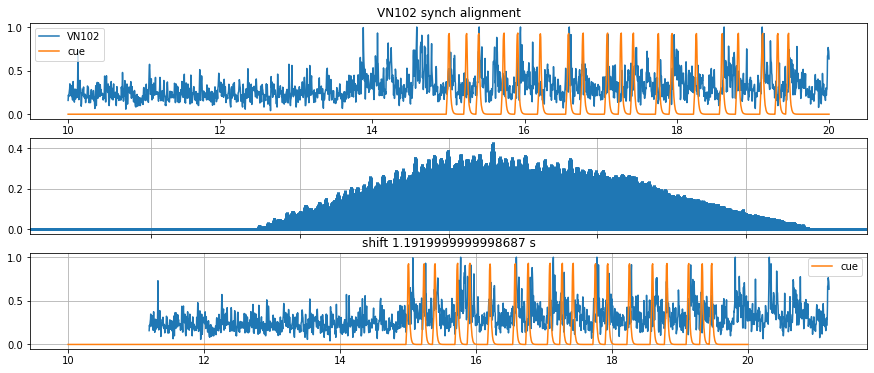

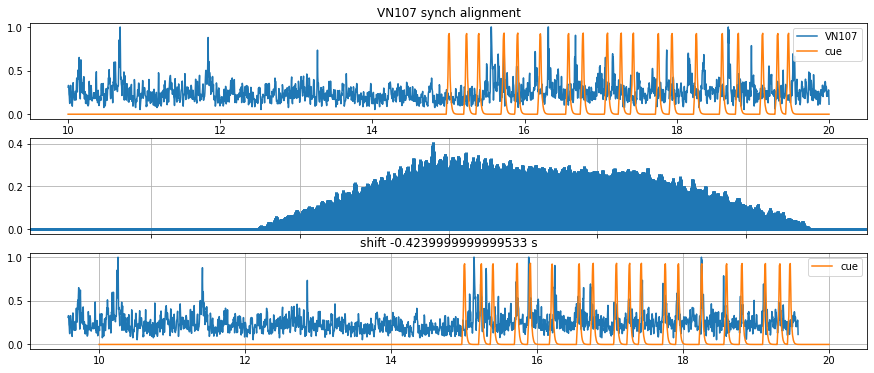

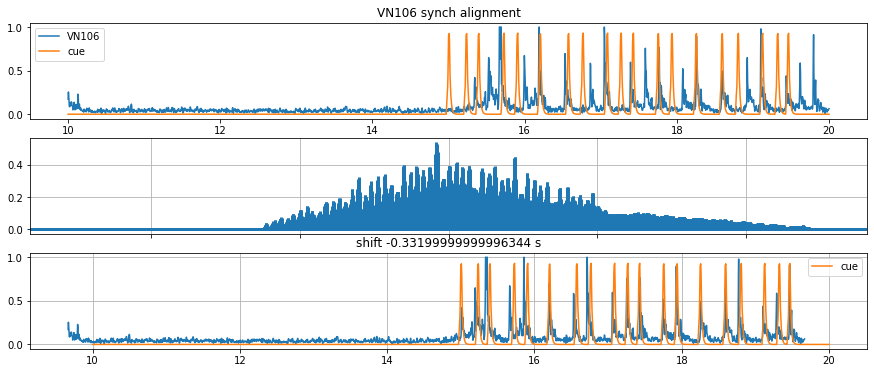

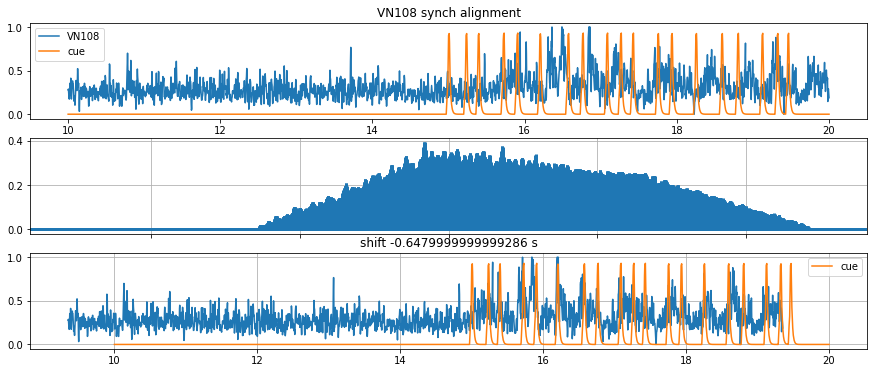

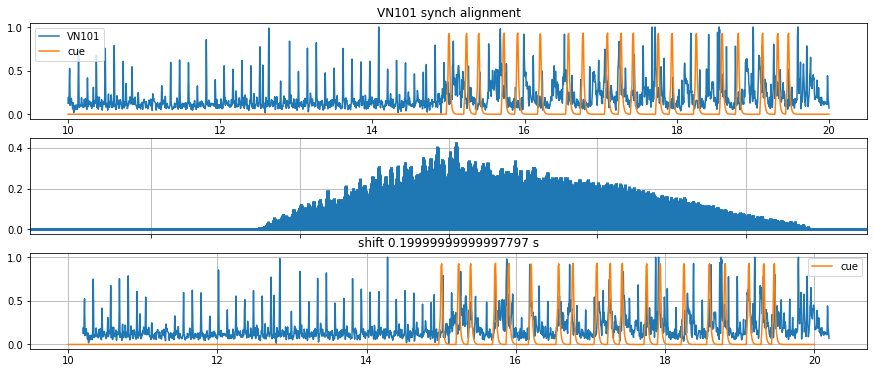

...

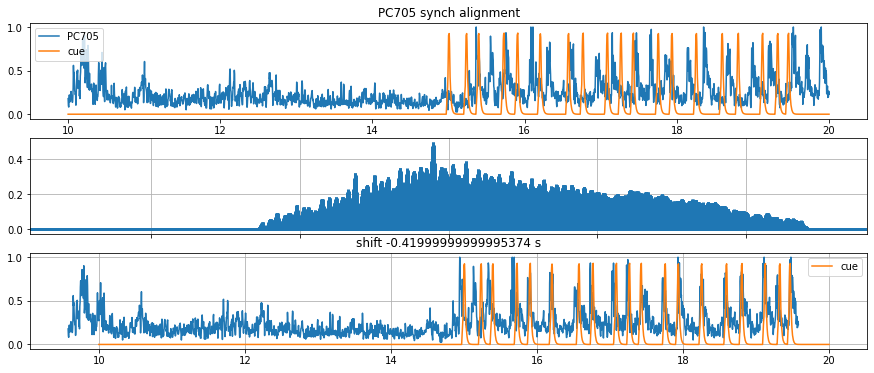

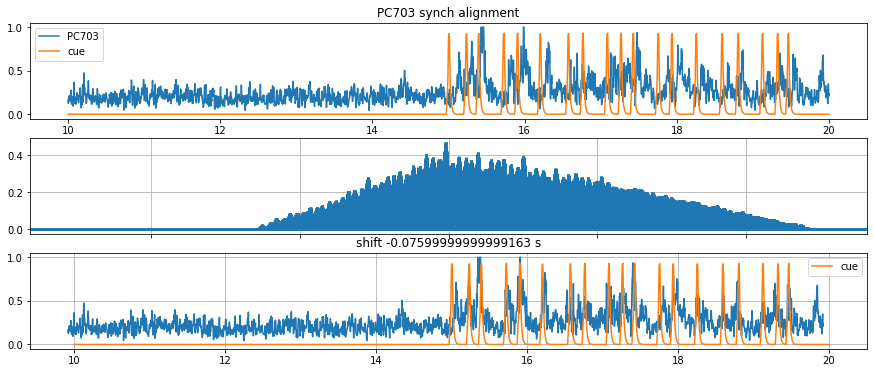

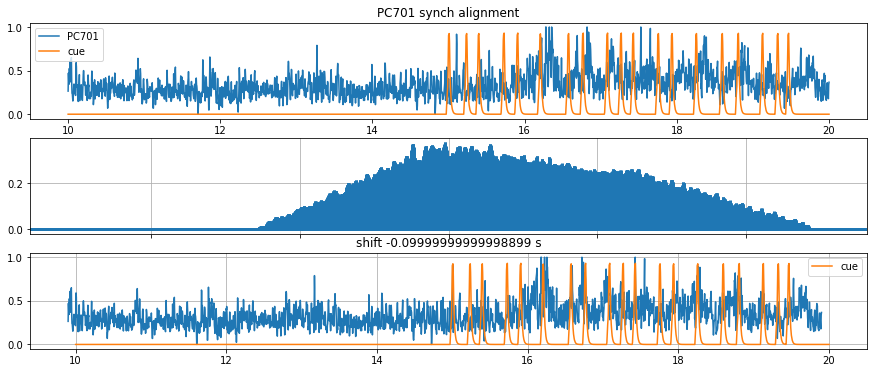

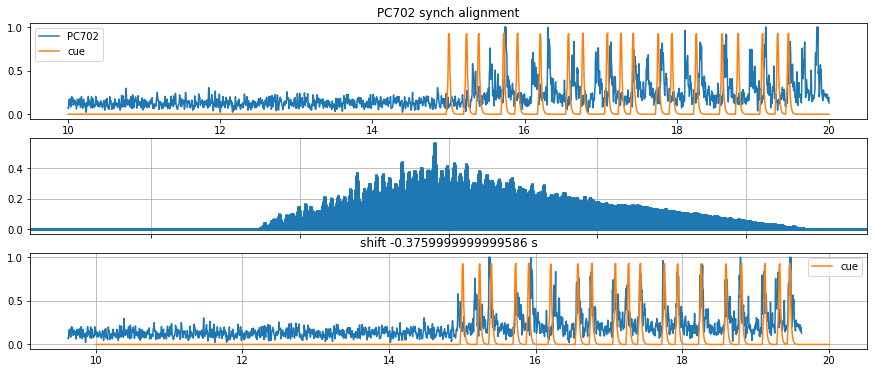

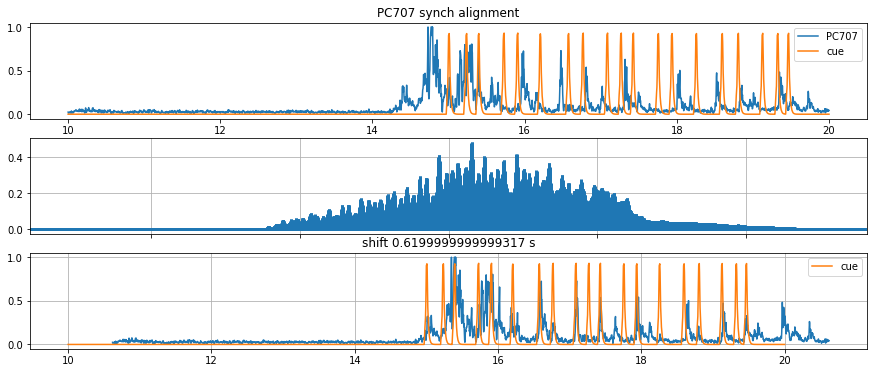

In [190]:
acc_day = sub_sig
sig_exs = acc_day.loc[cued.index[0]:cued.index[-1]]
cols = sig_exs.columns
shifts = []
for c in cols:
    shifts.append(tap_cue_align(cued,sig_exs[c],c))

In [191]:
shift_df = pd.DataFrame.from_records(shifts)
shift_df.set_index('devID',drop=True,inplace=True)
print(shift_df['s_offset_time'].median())
shift_df.to_csv('./out_data/initial_reic_synch_'+ projectName + '_offsets.csv')

-0.15599999999998282


## Dress test



In [519]:
projectName = 'RD'
sep = '/'
path = '../Data/Equivital/Reic/' + projectName + sep


# signal File type and column name (multi sample)
signal_file_type = 'EQACC'
sample_period = 1.0/256 # seconds 
interval_name = 'RD_Drei'
sigName = 'ACC'

synch_t = pd.to_datetime('2023-02-15 12:02:05.000+0000') 
s_time = pd.to_datetime('2023-02-15 12:01:51.000+0000')
e_time = pd.to_datetime('2023-02-15 12:02:21.000+0000')
dur = (e_time - s_time).total_seconds()
time_s =  np.round(np.arange(0,dur,sample_period),3)

time_dt = s_time + pd.to_timedelta(time_s,unit='s')
df_sig = pd.DataFrame(index = time_dt)

In [521]:
projectName = '2023-02-15_RE_DREI' # 2023-02-15_RE_DREI_VN210_EQIBI.csv
path = '/Users/finn/Desktop/Current_Projects/Stavanger/Data/Equivital/Reic/RD/'
sep = '/'
df_datafiles = eq_recordings(path,projectName,sep)
df_datafiles.set_index('DevName',inplace=True)
df_datafiles

,Signal,ID,Date,Session,Interval,FileName,FileType,FileSize,RecStart,RecEnd,...,FullLoc,SENSOR ID,SUBJECT ID,SUBJECT AGE,HR(BPM),HRC(%),BELT OFF,LEAD OFF,MOTION,BODY POSITION
DevName,,,,,,,,,,,,,,,,,,,,,
VA302,DATA,5022101,2023-02-15,RE,DREI,2023-02-15_RE_DREI_VA302_EQDATA.csv,csv,459,2023-02-15 12:01:37+00:00,2023-02-15 12:02:22+00:00,...,/Users/finn/Desktop/Current_Projects/Stavanger...,5022101.0,VA302,NaN,100.0,90.0,0.0,0.0,Stationary,Upright
VN210,DATA,5022098,2023-02-15,RE,DREI,2023-02-15_RE_DREI_VN210_EQDATA.csv,csv,459,2023-02-15 12:01:37+00:00,2023-02-15 12:02:22+00:00,...,/Users/finn/Desktop/Current_Projects/Stavanger...,5022098.0,VN210,NaN,79.0,99.0,0.0,0.0,Stationary,Upright
VA303,DATA,5022104,2023-02-15,RE,DREI,2023-02-15_RE_DREI_VA303_EQDATA.csv,csv,463,2023-02-15 12:01:37+00:00,2023-02-15 12:02:22+00:00,...,/Users/finn/Desktop/Current_Projects/Stavanger...,5022104.0,VA303,NaN,79.0,97.0,0.0,0.0,MovingSlowly,Upright
VN105,DATA,3420755,2023-02-15,RE,DREI,2023-02-15_RE_DREI_VN105_EQDATA.csv,csv,459,2023-02-15 12:01:38+00:00,2023-02-15 12:02:23+00:00,...,/Users/finn/Desktop/Current_Projects/Stavanger...,3420755.0,VN105,NaN,66.0,98.0,0.0,0.0,Stationary,Upright
VN205,DATA,5022060,2023-02-15,RE,DREI,2023-02-15_RE_DREI_VN205_EQDATA.csv,csv,457,2023-02-15 12:01:38+00:00,2023-02-15 12:02:23+00:00,...,/Users/finn/Desktop/Current_Projects/Stavanger...,5022060.0,VN205,NaN,67.0,98.0,0.0,0.0,Stationary,Upright
PC704,DATA,5022244,2023-02-15,RE,DREI,2023-02-15_RE_DREI_PC704_EQDATA.csv,csv,461,2023-02-15 12:01:38+00:00,2023-02-15 12:02:23+00:00,...,/Users/finn/Desktop/Current_Projects/Stavanger...,5022244.0,PC704,NaN,93.0,62.0,0.0,0.0,MovingSlowly,Upright
VN106,DATA,5022002,2023-02-15,RE,DREI,2023-02-15_RE_DREI_VN106_EQDATA.csv,csv,465,2023-02-15 12:01:38+00:00,2023-02-15 12:02:23+00:00,...,/Users/finn/Desktop/Current_Projects/Stavanger...,5022002.0,VN106,NaN,108.0,94.0,0.0,0.0,MovingSlowly,Upright
VA301,DATA,5022100,2023-02-15,RE,DREI,2023-02-15_RE_DREI_VA301_EQDATA.csv,csv,461,2023-02-15 12:01:39+00:00,2023-02-15 12:02:24+00:00,...,/Users/finn/Desktop/Current_Projects/Stavanger...,5022100.0,VA301,NaN,93.0,98.0,0.0,0.0,MovingSlowly,Upright
BR602,DATA,5022184,2023-02-15,RE,DREI,2023-02-15_RE_DREI_BR602_EQDATA.csv,csv,455,2023-02-15 12:01:39+00:00,2023-02-15 12:02:24+00:00,...,/Users/finn/Desktop/Current_Projects/Stavanger...,5022184.0,BR602,NaN,68.0,99.0,0.0,0.0,Stationary,Upright


In [522]:
s_files = df_datafiles
path

'/Users/finn/Desktop/Current_Projects/Stavanger/Data/Equivital/Reic/RD/'

Pull up the data from each file and press into a matrix with a shared sample times.

In [523]:
# for acceleration
signal_file_type = 'EQACC'
for i,row in s_files.iterrows():
    dataFile = row['FullLoc']
    PartName = i

    sigFileLoc = []
    matched = matched_files(dataFile,path,sep)
    for f in matched:
        if signal_file_type in f:
            sigFileLoc = f

    if sigFileLoc:
        V = pd.read_csv(sigFileLoc,skipinitialspace=True)
        V['DateTime'] = pd.to_datetime(V['DateTime']) 
        sig_t = (V['DateTime'].dt.tz_localize(None) - s_time.tz_localize(None)).dt.total_seconds()
        cols = V.columns
        df = V.loc[:,[ 'Vert Accelerometer','Lat Accelerometer','Long Accelerometer']]
        sig_v = np.sqrt(np.square(df.diff()).sum(axis=1))
        f = interpolate.interp1d(sig_t,sig_v,fill_value='extrapolate')
        new_sig = f(time_s)
        if pd.Series(new_sig).diff().abs().sum()/len(new_sig)>1: # since th
            df_sig.loc[:,PartName] = new_sig

In [524]:
data = df_sig.loc[:,player_order].copy()
data.iloc[:5,:]
# df_datafiles = df_datafiles.loc[player_order]
# df_datafiles

,VN102,VN107,VN106,VN108,VN101,VN105,VN103,VN104,VN205,VN203,...,BR606,BR607,BR605,BR601,PC704,PC705,PC703,PC701,PC702,PC707
2023-02-15 12:01:51+00:00,5.000000,5.765564,11.801906,8.944272,10.589248,14.703638,13.000000,9.000000,16.136693,3.500000,...,8.512777,11.090127,77.264691,13.472136,14.308773,13.123106,12.742079,7.647474,8.944272,9.870482
2023-02-15 12:01:51.004000+00:00,11.250000,10.237457,11.681925,8.000000,14.959756,15.934317,19.823374,2.236068,21.526701,6.750000,...,14.848854,14.966630,79.227849,15.865898,21.711655,14.605385,16.313948,8.544001,10.313755,13.845732
2023-02-15 12:01:51.008000+00:00,17.482051,14.822291,6.928203,16.031220,15.011989,11.218884,19.720123,10.831310,26.457379,12.162278,...,17.859216,13.674462,138.487501,10.348469,34.278941,9.708204,16.931328,15.348078,13.978931,15.312765
2023-02-15 12:01:51.012000+00:00,13.262285,11.222136,8.522186,4.000000,19.067386,8.035607,11.750000,16.951893,21.410565,15.015169,...,13.845732,9.584537,107.385040,10.732051,31.839716,12.000000,19.355136,17.754482,10.736833,10.024829
2023-02-15 12:01:51.016000+00:00,26.647888,16.666408,13.070430,14.966630,15.248682,11.918730,10.486068,18.943880,11.722901,18.821076,...,18.461862,8.122417,54.308889,8.512777,28.870341,11.449490,9.066699,18.391562,7.432730,12.949874


In [525]:
s_time = data.index[0]
e_time = data.index[-1] 
sig_t = np.round(pd.Series(data.index - s_time).dt.total_seconds(),3)
df_sig = pd.DataFrame(index = sig_t, columns = data.columns,data = data.values)

In [715]:
t1 = 5
t2 = 15

interval_name = 'Synch'
sub_sig = df_sig.loc[t1:t2,:].copy()

In [716]:
dev_int_s_time = s_time + pd.to_timedelta(t1,unit='s')
dev_int_s_time

Timestamp('2023-02-15 12:01:56+0000', tz='UTC')

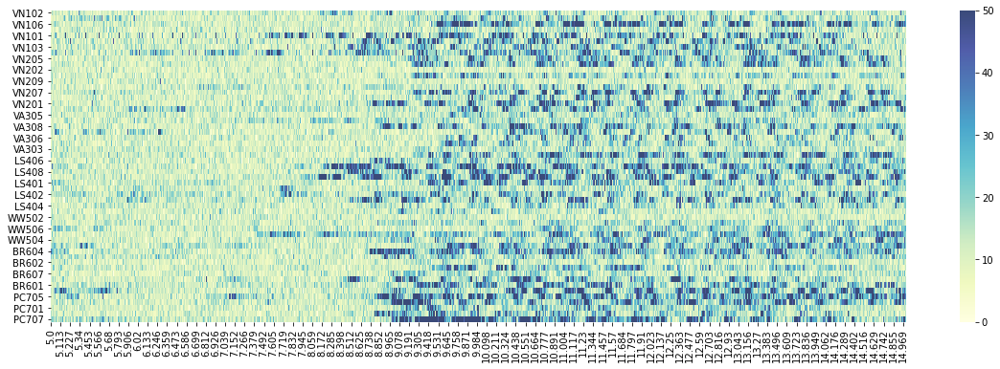

In [717]:
fig, (ax1) = plt.subplots(1, 1,figsize = [20,6])
chart = sns.heatmap(data=sub_sig.transpose(), ax=ax1,vmin=0, vmax=50, cbar=True,cmap="YlGnBu",alpha=0.8)
#plt.title(projectName + ' ' + sigName + ' for interval ' + interval_name)
plt.savefig('./plots/'+projectName+'_'+ interval_name+ '_set_'+sigName+'.png',dpi = 300)
plt.show()

<AxesSubplot:>

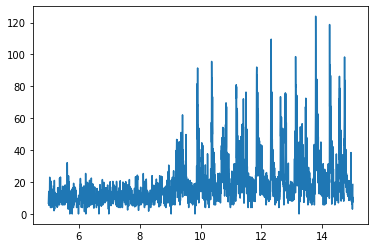

In [718]:
# first find tapping timing in one acc recording from delsys
sensorID = 'VN205'
sig_df = sub_sig[sensorID]
sig_df.plot() 

From a test plot of the whole acc signal, estimate the timing of the tapping cue in device time stamp values. Set this as initial_offset and iterate a few times to get this right to the correct offset time within tolerance. For this study we are getting aligning to within 100 ms, the best we can count on for the parallel recordings in the Movesense. 

This degree of alignment is within the range that can be fine tuned by the cross correlation if necessary. Because delsys has all the acc recordings on the same device time, we won't be adjusting individual sensor recordings from their respective suggested offsets.

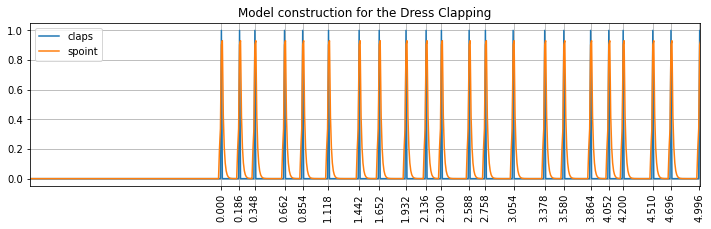

In [719]:
t_range = [-15, 25]
# cues for synchronisation taps
cues = pd.DataFrame(index = np.round(np.arange(0,t_range[1]-t_range[0],0.01)+t_range[0],2))
sampleshift = 1.0/256 # seconds 


cues['claps'] = 0
for t in claps_times['PTime']:
    cues.loc[np.round(t,2),'claps'] = 1

cues['spoint'] = 0.5*cues['claps'].rolling(2, win_type='gaussian', center=True).sum(std=2) + 0.5*cues['claps'].rolling(5, win_type='gaussian', center=True).sum(std=3).ewm(span = 3).mean()
cues[cues.isna()] = 0
# triang(M, sym=True)
Cue_template = cues.copy()
Cue_template.plot(figsize = [12,3]) 
plt.xticks(claps_times.PTime,rotation='vertical')
plt.grid()
plt.xlim([-2,5])
plt.title('Model construction for the Dress Clapping')
#plt.savefig('./Timing/synch1_cues.png')
plt.show()

#Cue_template.to_csv('./Timing/Synch_Cue_template_100Hz.csv')

In [720]:
initial_offset = 9

2561
2561


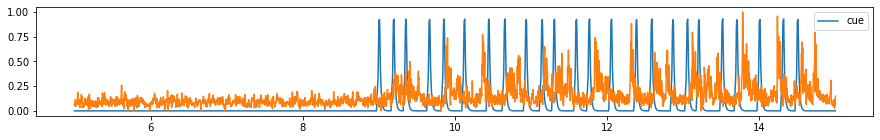

In [721]:
cues = Cue_template.copy()
cues['time_concert'] = cues.index
cues['DeviceTime'] = cues.index + initial_offset
cues.set_index('DeviceTime',inplace=True)

sig_ex = sub_sig[sensorID]/sub_sig[sensorID].max()
print(len(sig_ex))
sig_ID = sensorID
cuetype = 'spoint'

f = interpolate.interp1d(cues.index, cues[cuetype],fill_value='extrapolate')
cued = pd.DataFrame(index = sig_ex.index,data = f(np.array(sig_ex.index)),columns = ['cue'])
f = interpolate.interp1d(cues.index, cues['time_concert'],fill_value='extrapolate')
cued['time_concert'] = f(np.array(sig_ex.index))
print(len(cued))

cued.plot.line(y = 'cue')
sig_ex.plot(figsize=[15,2])
#plt.xlim([cued.index[2500],cued.index[8500]])

plt.show()

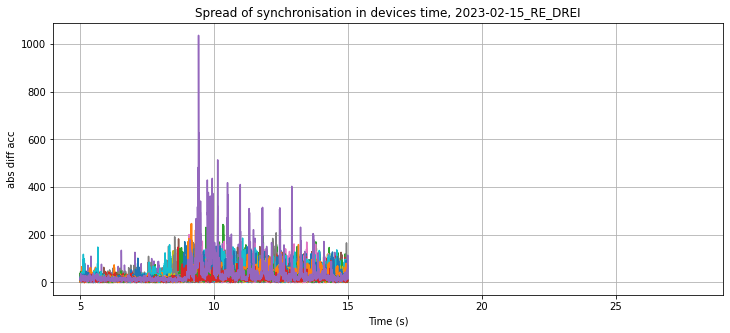

In [722]:
acc_day = sub_sig
acc_day.plot(figsize=(12,5),legend = False)
plt.ylabel('abs diff acc')
plt.title('Spread of synchronisation in devices time, '+ projectName)
plt.xlim([initial_offset -5 ,initial_offset + 20])
plt.xlabel('Time (s)')
plt.grid()
# plt.legend()
# plt.ylim([0,1000])
#plt.savefig('./plots/'+projectName+'_uncorrected_taps.png',dpi = 300)

plt.show()

Initial automated alignment attempt and then correction phase

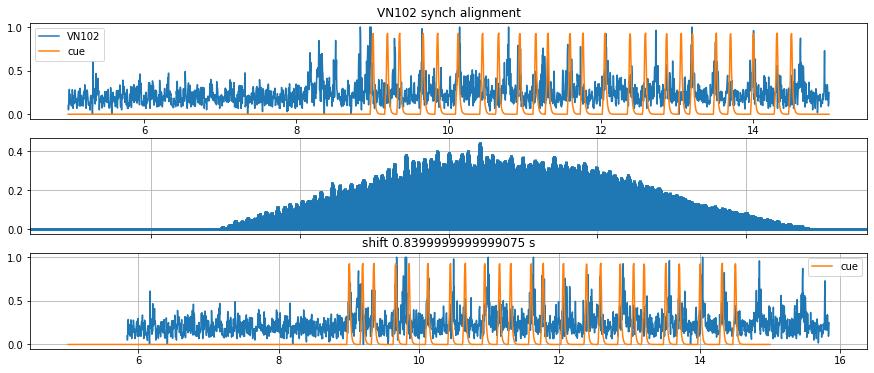

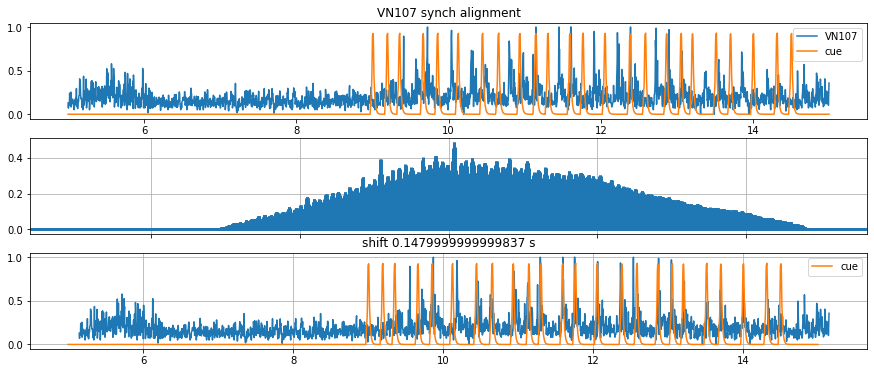

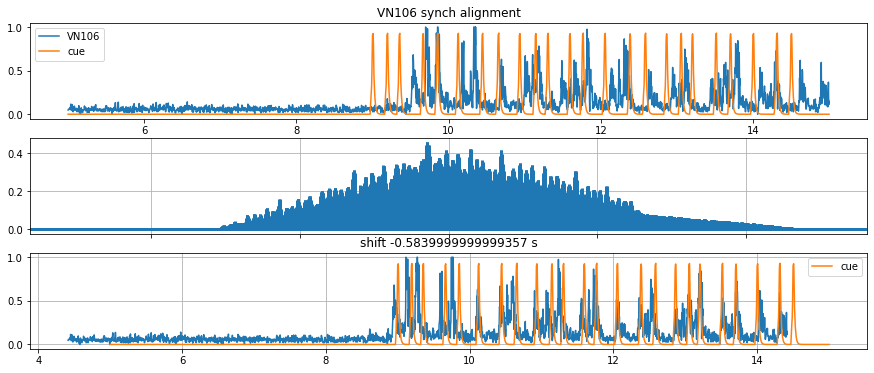

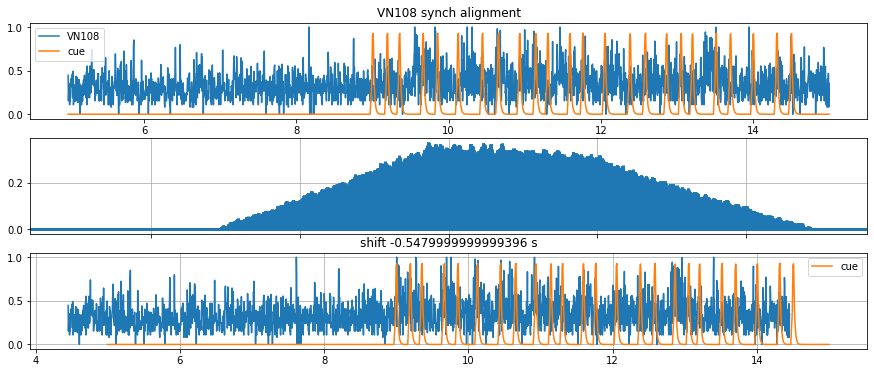

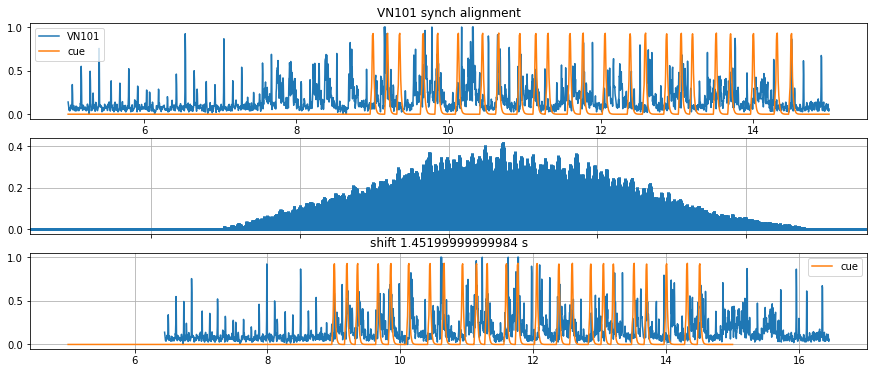

...

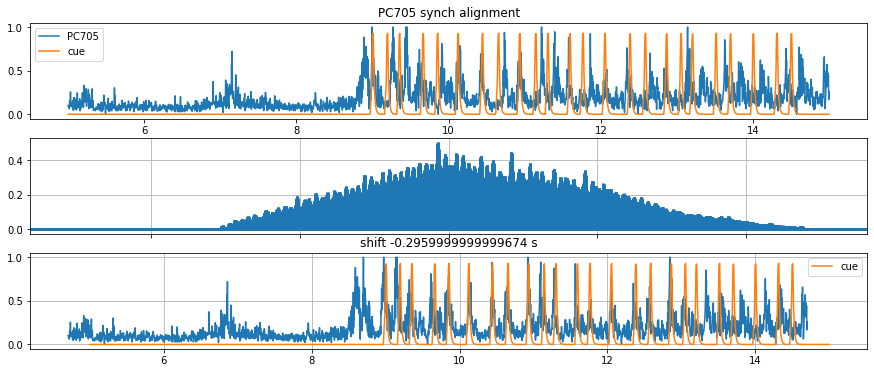

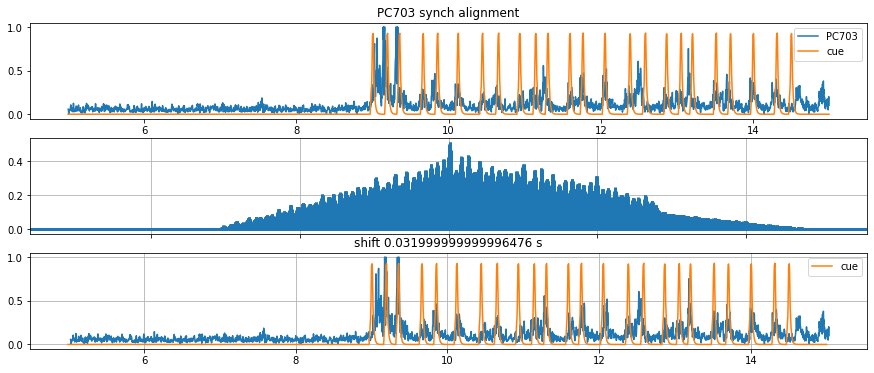

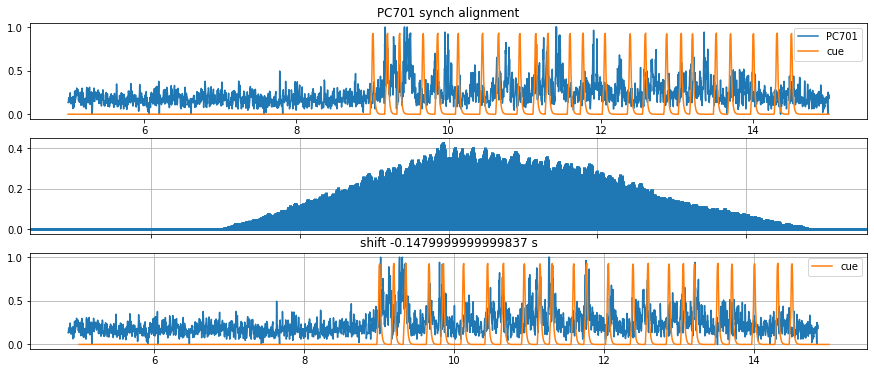

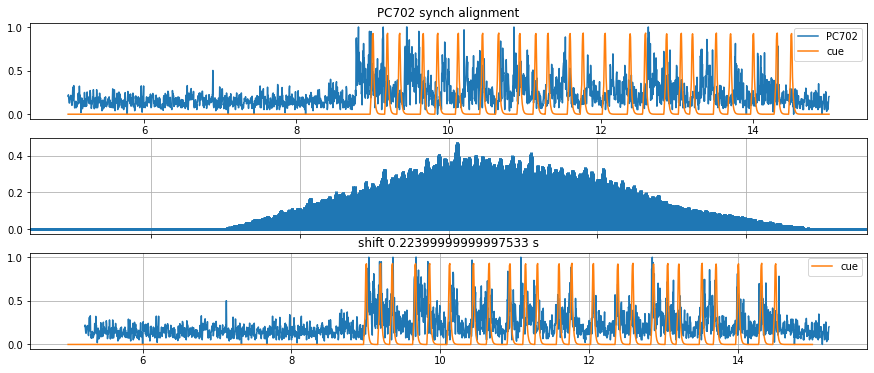

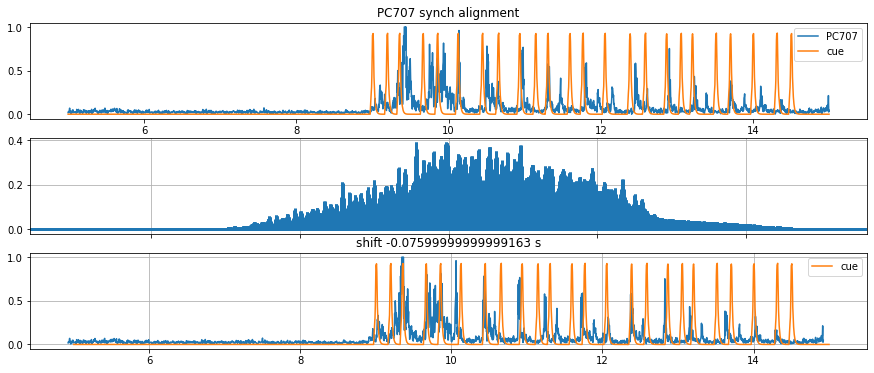

In [723]:
sig_exs = acc_day.loc[cued.index[0]:cued.index[-1]]
cols = sig_exs.columns
shifts = []
for c in cols:
    shifts.append(tap_cue_align(cued,sig_exs[c],c))

In [724]:
shift_df = pd.DataFrame.from_records(shifts)
shift_df.set_index('devID',drop=True,inplace=True)
print(shift_df['s_offset_time'].median())
shift_df.to_csv('./out_data/initial_reic_synch_'+ projectName + '_offsets.csv')

0.031999999999996476


In [725]:
projectName

'2023-02-15_RE_DREI'

In [726]:
shift_df

,s_corr0,s_corr_offset,s_offset_samples,s_offset_time,Length_xcorr_samples,Length_xcorr_time,auto_offset_time,Full_CCC
devID,,,,,,,,
VN102,0.396932,0.448005,210,0.840,5121,20.484,0.840,"([-2560, -2559, -2558, -2557, -2556, -2555, -2..."
VN107,0.325747,0.488050,37,0.148,5121,20.484,0.148,"([-2560, -2559, -2558, -2557, -2556, -2555, -2..."
VN106,0.308358,0.459525,-146,-0.584,5121,20.484,-0.584,"([-2560, -2559, -2558, -2557, -2556, -2555, -2..."
VN108,0.342053,0.373275,-137,-0.548,5121,20.484,-0.548,"([-2560, -2559, -2558, -2557, -2556, -2555, -2..."
VN101,0.320270,0.421142,363,1.452,5121,20.484,1.452,"([-2560, -2559, -2558, -2557, -2556, -2555, -2..."
VN105,0.308970,0.580910,90,0.360,5121,20.484,0.360,"([-2560, -2559, -2558, -2557, -2556, -2555, -2..."
VN103,0.422822,0.518943,126,0.504,5121,20.484,0.504,"([-2560, -2559, -2558, -2557, -2556, -2555, -2..."
VN104,0.375598,0.438591,88,0.352,5121,20.484,0.352,"([-2560, -2559, -2558, -2557, -2556, -2555, -2..."
VN205,0.289829,0.537768,-63,-0.252,5121,20.484,-0.252,"([-2560, -2559, -2558, -2557, -2556, -2555, -2..."


# Manual correction of initial synchronisation correction 
The auto alignment is about 40 % correct. Needs supervision to get around poor tapping and other errors.

This next sequence of cells go through synch cues one at a time and allow for their values to be corrected in the shifts DataFrame.

In [192]:
i = 0

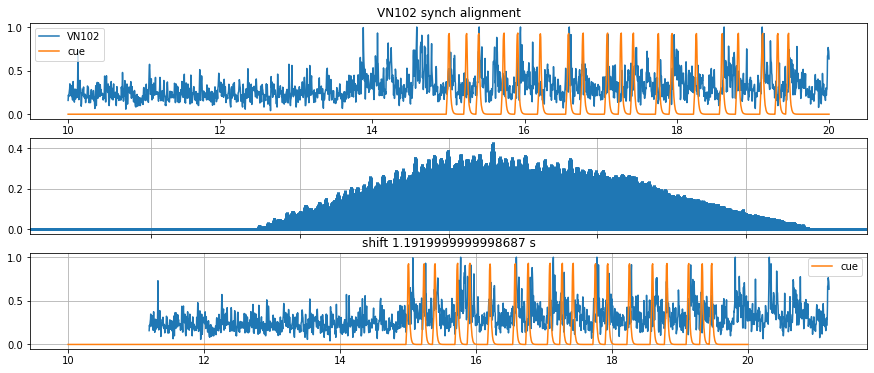

In [193]:
cols = sig_exs.columns
c = cols[i]
s = tap_cue_align(cued,sig_exs[c],c)

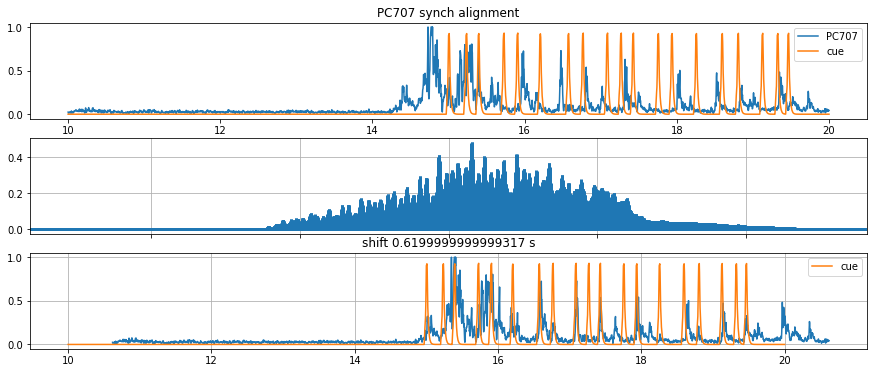

In [295]:
i+=1
c = cols[i]
s = tap_cue_align(cued,sig_exs[c],c)

In [296]:
##### local peaks in CCC
CCC = s['Full_CCC']
mid_off = int((s['Length_xcorr_samples']-1)/2)
ccthresh = 0.35

V =np.clip(CCC[1], ccthresh, 1)
pks = pd.DataFrame()
pks['ind'] = argrelextrema(V, np.greater)[0]
pks['corr']= V[argrelextrema(V, np.greater)]
pks['shift'] = (argrelextrema(V, np.greater)[0]-mid_off)/256
pks

,ind,corr,shift
0,2494,0.416155,-0.257812
1,2621,0.371109,0.238281
2,2715,0.485223,0.605469
3,2801,0.408681,0.941406
4,2931,0.384653,1.449219
5,3018,0.419498,1.789062
6,3236,0.371515,2.640625


[-66, 0.41615547440502504]


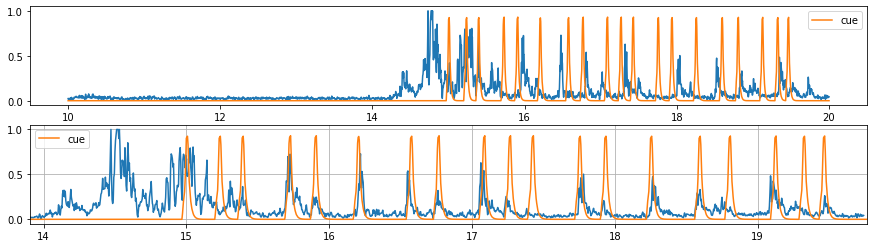

In [297]:
#offs = s['s_offset_samples']
offs = pks.loc[0,'ind'] - mid_off
slips = offs + mid_off #-1
print([CCC[0][slips],CCC[1][slips]])

signal = sig_exs[c].copy() # make the signal excerpt corr compatible. Inclusing cutting the extreme peaks
signal[signal.isna()] = 0
M = signal.quantile(0.998)
signal = signal/M
signal[signal>1] = 1
fig = plt.figure(figsize=(15,4))
ax1 = plt.subplot(211)
signal.plot(ax=ax1)
cued.plot.line(y='cue',ax=ax1)
signal.index = signal.index + sample_period*CCC[0][slips]
ax1 = plt.subplot(212)
signal.plot(ax=ax1)
cued.plot.line(y='cue',ax=ax1)
plt.xlim([cued.index[1000],cued.index[2500]])
ax1.grid(True)
plt.show()

In [298]:
#### correct record of alignment
shift_true = slips #np.argmax(CCC1[1])
print([str(c),shift_true,CCC[0][shift_true], (sample_period*CCC[0][shift_true]), len(CCC[0]),len(CCC[0])*sample_period]) #,(np.argmax(xc,axis=0)-len(d_Range))/fs,mid
shift_df.loc[c,'s_corr_offset'] =CCC[1][shift_true]
shift_df.loc[c,'s_offset_samples'] = offs 
shift_df.loc[c,'s_offset_time'] = sample_period*CCC[0][shift_true]
shift_df.loc[c, "dt_offset"] = dev_int_s_time + pd.to_timedelta(sample_period*shift_true,unit='s')
#shift_df.loc[c,:]

['PC707', 2494, -66, -0.2578125, 5121, 20.00390625]


In [261]:
# correct record of alignment by REMOVING CUE ESTIMATE BECAUSE THERE WERE NO TAPS
shift_true = np.nan #np.argmax(CCC1[1])
print([str(c),shift_true]) #,(np.argmax(xc,axis=0)-len(d_Range))/fs,mid
shift_df.loc[c,'s_corr_offset'] =np.nan
shift_df.loc[c,'s_offset_time'] = np.nan
#shift_df.loc[c,:]

['WW502', nan]


### Corrected synchronisation offsets
The index_offset field (corrected to "auto_offset_time") actually retains the initial offset, so we can use discrepensy with s_offset_time to note which had to be adjusted.

the additional field of 'synch_dev_time' marks the time of the synchronisation taps start (tap 1)  in the raw recordings device clock times. Corrections can then be performed from here to whatever gets defined as the real synch time.

In [299]:
shift_df['synch_dev_time'] = s_time + pd.to_timedelta(initial_offset + shift_df['s_offset_time'],unit='s')
shift_df.to_csv('./out_data/CorrectedEQ_reic_synch_'+ projectName + '_offsets.csv')

# Check aligning quality acheived

In [435]:
synch_times = clap_times
synch_times
#2023-02-15 11:16:50.209

{'RD': Timestamp('2023-02-15 11:16:50.719000'),
 'C1': Timestamp('2023-02-16 08:45:22.246000'),
 'C2': Timestamp('2023-02-16 10:27:10.927000'),
 'C3': Timestamp('2023-02-17 08:40:31.007000'),
 'C4': Timestamp('2023-02-17 10:27:23.179000'),
 'C5': Timestamp('2023-02-18 15:22:04.555000')}

In [432]:
player_order = ['VN102','VN107','VN106','VN108','VN101','VN105','VN103','VN104','VN205','VN203','VN202','VN206','VN209','VN210','VN207','VN208','VN201','VN204','VA305','VA307','VA308','VA301','VA306','VA302','VA303','VA304','LS406','LS407','LS408','LS405','LS401','LS403','LS402','LS410','LS404','WW505','WW502','WW503','WW506','WW501','WW504','WW507','BR604','BR603','BR602','BR606','BR607','BR605','BR601','PC704','PC705','PC703','PC701','PC702','PC707']

In [436]:
projectName = 'RD'
sep = '/'
path = '../Data/Equivital/Reic/' + projectName + sep


# signal File type and column name (multi sample)
signal_file_type = 'EQACC'
sample_period = 1.0/256 # seconds 
interval_name = 'RD_Reic'
sigName = 'ACC'
s_time=(synch_intervals.loc[projectName,'Start']).tz_convert(tz=dt.timezone.utc)
e_time=(synch_intervals.loc[projectName,'End']).tz_convert(tz=dt.timezone.utc)
dur = (e_time - s_time).total_seconds()
time_s =  np.round(np.arange(0,dur,sample_period),3)

time_dt = s_time + pd.to_timedelta(time_s,unit='s')
df_sig = pd.DataFrame(index = time_dt,columns=player_order)
df_shig = pd.DataFrame(index = time_dt,columns=player_order)

In [448]:
projectName = '2023-02-15_RE_REIC'
path = '/Users/finn/Desktop/Current_Projects/Stavanger/Data/Equivital/Reic/RD/'
sep = '/'
df_datafiles = eq_recordings(path,projectName,sep)
df_datafiles.set_index('DevName',inplace=True)
df_datafiles
s_files = df_datafiles.copy()


In [449]:
shifts = pd.read_csv('./out_data/CorrectedEQ_reic_synch_'+ projectName + '_offsets.csv')
shifts['synch_dev_time'] = pd.to_datetime(shifts['synch_dev_time'])
shifts.set_index('devID',inplace=True)
shifts['synch_dev_time'].mean()

Timestamp('2023-02-15 11:16:50.209607168+0000', tz='UTC')

In [ ]:
    dev_offset = (synch_times[projectName].tz_localize(None)- shifts.loc[PartName,'synch_dev_time'].tz_localize(None)).total_seconds()#.total_seconds()# approx offset of cue and signal


In [457]:
a = synch_times[projectName].tz_localize(None) - shifts.loc[PartName,'synch_dev_time'].tz_localize(None)
a.total_seconds()

0.872

In [454]:
shifts.loc[PartName,'synch_dev_time'].tz_localize(None)

Timestamp('2023-02-15 11:16:49.847000')

In [459]:
projectName = 'RD'
# for acceleration
signal_file_type = 'EQACC'
for i,row in s_files.iterrows():
    dataFile = row['FullLoc']
    PartName = i
    a = synch_times[projectName].tz_localize(None) - shifts.loc[PartName,'synch_dev_time'].tz_localize(None)
    dev_offset = a.total_seconds()

    sigFileLoc = []
    matched = matched_files(dataFile,path,sep)
    for f in matched:
        if signal_file_type in f:
            sigFileLoc = f

    if sigFileLoc:
        V = pd.read_csv(sigFileLoc,skipinitialspace=True)
        V['DateTime'] = pd.to_datetime(V['DateTime']) 
        sig_t = (V['DateTime'].dt.tz_localize(None) - s_time.tz_localize(None)).dt.total_seconds()
        cols = V.columns
        df = V.loc[:,[ 'Vert Accelerometer','Lat Accelerometer','Long Accelerometer']]
        sig_v = np.sqrt(np.square(df.diff()).sum(axis=1))
        
        f = interpolate.interp1d(sig_t,sig_v,fill_value='extrapolate')
        new_sig = f(time_s)
        if pd.Series(new_sig).diff().abs().sum()/len(new_sig)>1: # since th
            df_sig.loc[:,PartName] = new_sig
            
            if not math.isnan(dev_offset):
                sig_t -= dev_offset
                f = interpolate.interp1d(sig_t,sig_v,fill_value='extrapolate')
                new_sig = f(time_s)
                if pd.Series(new_sig).diff().abs().sum()/len(new_sig)>1: # since th
                    df_shig.loc[:,PartName] = new_sig
            else: # if the signal can't be synched, skip it.
                df_shig.loc[:,PartName] = np.nan

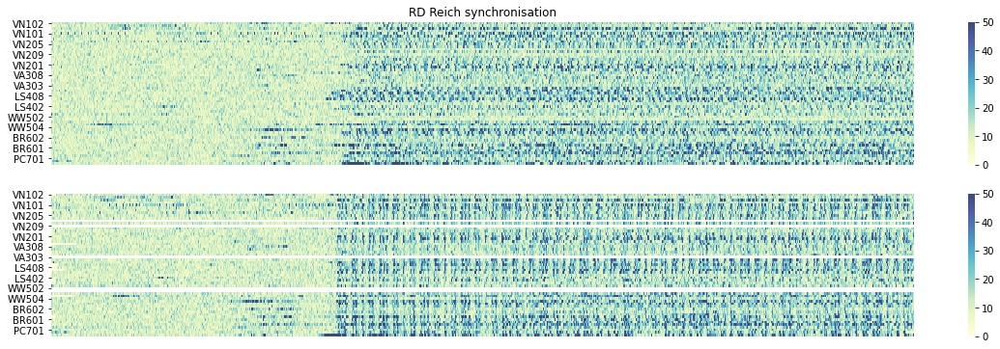

In [460]:
fig, (ax1,ax2) = plt.subplots(2, 1,figsize = [20,6])
chart = sns.heatmap(data=df_sig.transpose(), ax=ax1,vmin=0, vmax=50, cbar=True,cmap="YlGnBu",alpha=0.8)
ax1.set_title(projectName + ' Reich synchronisation')
ax1.set_xticks([])
chart = sns.heatmap(data=df_shig.transpose(), ax=ax2,vmin=0, vmax=50, cbar=True,cmap="YlGnBu",alpha=0.8)
ax2.set_xticks([])
plt.savefig('./plots/'+projectName+'_'+ interval_name+ '_reic_synch_cue.png',dpi = 300)
plt.show()

## same day corrections
How is alignment from C2 on C1. C3 on C4?

In [461]:
projectName = 'RD'
sep = '/'
path = '../Data/Equivital/Reic/' + projectName + sep


# signal File type and column name (multi sample)
signal_file_type = 'EQACC'
sample_period = 1.0/256 # seconds 
interval_name = 'RD_Reic'
sigName = 'ACC'
s_time=(synch_intervals.loc[projectName,'Start']).tz_convert(tz=dt.timezone.utc)
e_time=(synch_intervals.loc[projectName,'End']).tz_convert(tz=dt.timezone.utc)
dur = (e_time - s_time).total_seconds()
time_s =  np.round(np.arange(0,dur,sample_period),3)

time_dt = s_time + pd.to_timedelta(time_s,unit='s')
df_sig = pd.DataFrame(index = time_dt,columns=player_order)
df_shig = pd.DataFrame(index = time_dt,columns=player_order)
df_shigalt = pd.DataFrame(index = time_dt,columns=player_order)

In [462]:
projectName = '2023-02-15_RE_REIC'
path = '/Users/finn/Desktop/Current_Projects/Stavanger/Data/Equivital/Reic/RD/'
sep = '/'
df_datafiles = eq_recordings(path,projectName,sep)
df_datafiles.set_index('DevName',inplace=True)
df_datafiles
s_files = df_datafiles.copy()

In [466]:
projectName = 'RD'
synch_dtA = synch_times[projectName]
synch_dtB = synch_times['RD']

shiftsA = pd.read_csv('./out_data/CorrectedEQ_reic_synch_2023-02-15_RE_REIC_offsets.csv')
shiftsA['synch_dev_time'] = pd.to_datetime(shiftsA['synch_dev_time'])
shiftsA.set_index('devID',inplace=True)
shiftsA['synch_dev_time'].mean()

shiftsB = pd.read_csv('./out_data/CorrectedEQ_synch_2023-02-15_RE_REIC_offsets.csv')
shiftsB['synch_dev_time'] = pd.to_datetime(shiftsB['synch_dev_time'])
shiftsB.set_index('devID',inplace=True)
shiftsB['synch_dev_time'].mean()

Timestamp('2023-02-15 11:16:50.046924288+0000', tz='UTC')

In [469]:
# for acceleration
for i,row in s_files.iterrows():
    dataFile = row['FullLoc']
    PartName = i
    a = synch_dtA.tz_localize(None) - shiftsA.loc[PartName,'synch_dev_time'].tz_localize(None)
    dev_offsetA = a.total_seconds()
    a = synch_dtB.tz_localize(None) - shiftsB.loc[PartName,'synch_dev_time'].tz_localize(None)
    dev_offsetB = a.total_seconds()


    sigFileLoc = []
    matched = matched_files(dataFile,path,sep)
    for f in matched:
        if signal_file_type in f:
            sigFileLoc = f

    if sigFileLoc:
        V = pd.read_csv(sigFileLoc,skipinitialspace=True)
        V['DateTime'] = pd.to_datetime(V['DateTime']) 
        sig_t = (V['DateTime'].dt.tz_localize(None) - s_time.tz_localize(None)).dt.total_seconds()
        cols = V.columns
        df = V.loc[:,[ 'Vert Accelerometer','Lat Accelerometer','Long Accelerometer']]
        sig_v = np.sqrt(np.square(df.diff()).sum(axis=1))
        
        f = interpolate.interp1d(sig_t,sig_v,fill_value='extrapolate')
        new_sig = f(time_s)
        if pd.Series(new_sig).diff().abs().sum()/len(new_sig)>1: # since th
            df_sig.loc[:,PartName] = new_sig
            
            if not math.isnan(dev_offsetA):
                sig_t -= dev_offsetA
                f = interpolate.interp1d(sig_t,sig_v,fill_value='extrapolate')
                new_sig = f(time_s)
                if pd.Series(new_sig).diff().abs().sum()/len(new_sig)>1: # since th
                    df_shig.loc[:,PartName] = new_sig
            else: # if the signal can't be synched, skip it.
                df_shig.loc[:,PartName] = np.nan
                
            if not math.isnan(dev_offsetB):
                sig_t -= dev_offsetB
                f = interpolate.interp1d(sig_t,sig_v,fill_value='extrapolate')
                new_sig = f(time_s)
                if pd.Series(new_sig).diff().abs().sum()/len(new_sig)>1: # since th
                    df_shigalt.loc[:,PartName] = new_sig
            else: # if the signal can't be synched, skip it.
                df_shigalt.loc[:,PartName] = np.nan

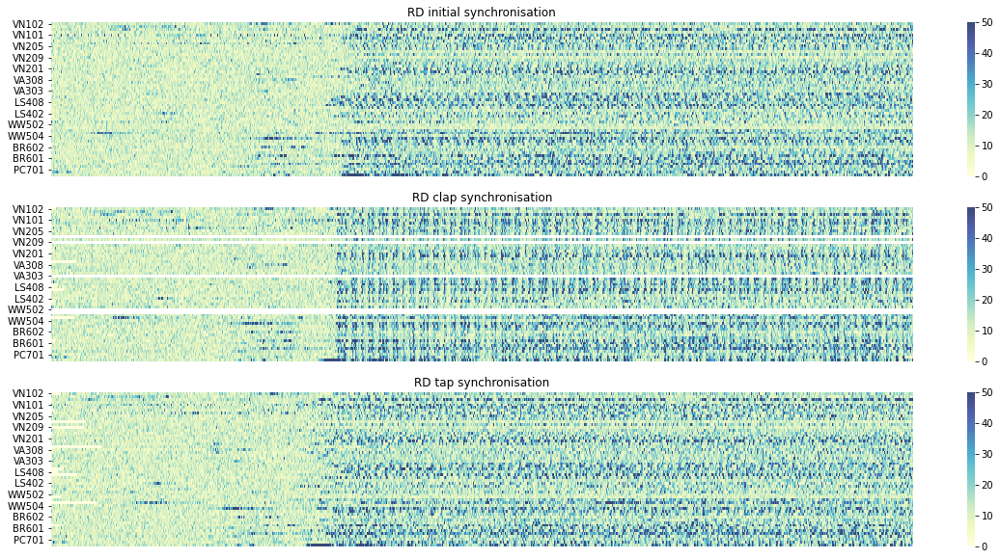

In [470]:
fig, (ax1,ax2,ax3) = plt.subplots(3, 1,figsize = [20,10])
chart = sns.heatmap(data=df_sig.transpose(), ax=ax1,vmin=0, vmax=50, cbar=True,cmap="YlGnBu",alpha=0.8)
ax1.set_title(projectName + ' initial synchronisation')
ax1.set_xticks([])
chart = sns.heatmap(data=df_shig.transpose(), ax=ax2,vmin=0, vmax=50, cbar=True,cmap="YlGnBu",alpha=0.8)
ax2.set_title(projectName + ' clap synchronisation')
ax2.set_xticks([])
chart = sns.heatmap(data=df_shigalt.transpose(), ax=ax3,vmin=0, vmax=50, cbar=True,cmap="YlGnBu",alpha=0.8)
ax3.set_title(projectName + ' tap synchronisation')
ax3.set_xticks([])
plt.savefig('./plots/'+projectName+'_'+ interval_name+ '_synch_cue_compared.png',dpi = 300)
plt.show()

In [1962]:
shiftsA['synch_dev_time'].std()

Timedelta('0 days 00:00:01.021987542')

In [1961]:
(shiftsB['synch_dev_time']-shiftsA['synch_dev_time']).std()

Timedelta('0 days 00:00:00.221681720')

The standard deviation in misalignment between devices and concert time is down from a second without synchronisation to a quarter of a second with a cue from 100 minutes ago.

Some of the difference between first and second synch times is from misalignments. Some will be from clock drift. These can be improved with excerpts from other parts of the concerts.

# Last tests and Corrections

The synchronisation of equivital measurements can be tested against clapping music. Extract clapping for each concert and check:

1. Alignment on 5 rated alignments for drift
2. Alignment on 4 and 3 rated for confirmation of beat selection and alignment.
3. Alignment on 2 and 1 (who was really absent)

In [ ]:
'/Users/finn/Desktop/Current_Projects/Stavanger/Data/Equivital/Reic/C2/'